# Remote Work Trends (2016–2022)

## Overview
This analysis examines the rise in remote work trends across the United States from 2016 to 2022. Using data from the American Community Survey (ACS), the percentage of workers who worked from home each year was calculated and visualized.

## Methods
1. **Data Collection:**
   - Data for total commuters (`B08006_001E`) and workers who worked from home (`B08006_017E`) was retrieved for each U.S. county from the ACS 5-Year estimates for the years 2016 to 2022.
2. **Percentage Calculation:**
   - For each county and year, the percentage of remote workers was calculated as:
     \[
     \text{Remote Work Percentage} = \left(\frac{\text{Worked from Home}}{\text{Total Commuters}}\right) \times 100
     \]
3. **Trend Analysis:**
   - The average remote work percentage was computed at the national level for each year.
4. **Visualization:**
   - A line plot was generated to display the yearly average remote work percentages from 2016 to 2022.

## Results
- **Steady Growth:**
  - Remote work percentage exhibited steady growth between 2016 and 2019, reflecting gradual adoption of flexible work practices.
- **Sharp Increase (2020–2022):**
  - A significant spike in remote work occurred from 2020 onwards, coinciding with the COVID-19 pandemic and the resulting shift to remote work environments.
- **Peak in 2022:**
  - By 2022, the national average for remote work reached its highest level, reflecting sustained adoption of remote work practices even as pandemic-related restrictions eased.

## Conclusion
The data underscores the transformative impact of the COVID-19 pandemic on work patterns in the U.S., with a dramatic shift toward remote work. The continued upward trend post-2020 suggests a lasting change in the workforce landscape, with remote work becoming a normalized aspect of many industries. Future analysis could explore state or sector-level variations and the long-term implications of this shift.


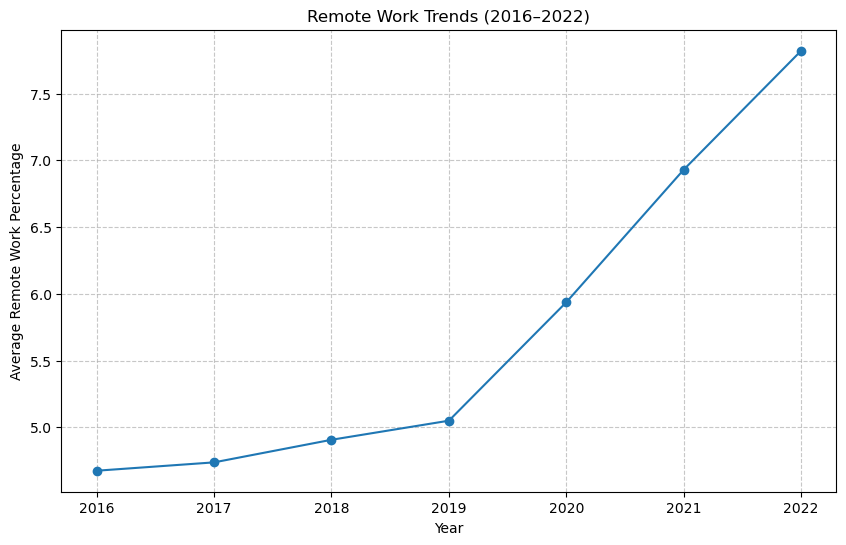

In [10]:
import warnings;warnings.filterwarnings("ignore")
%matplotlib inline
import matplotlib.pyplot as plt
import requests;import censusdata
from census import Census
from us import states
import pandas as pd; import geopandas as gpd
from pygris import counties
from mpl_toolkits.axes_grid1 import make_axes_locatable
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
import matplotlib.image as mpimg
from census import Census
from us import states
api_key = "2a2f8febfd3cdfeebbaaa1e54064cff81232875c"

variables = {'B08006_001E': 'Total Commuters','B08006_017E': 'Worked from Home'}
dataframes = []
for year in range(2016, 2023):
    df = censusdata.download('acs5',year,  
        censusdata.censusgeo([('state', '*'), ('county', '*')]),  
        list(variables.keys()))
    df.rename(columns=variables, inplace=True)
    df['Year'] = year
    dataframes.append(df)

remote_work_data = pd.concat(dataframes).reset_index()
remote_work_data.rename(columns={'index': 'Geography'}, inplace=True)
remote_work_data['Remote_Work_Percentage'] = (remote_work_data['Worked from Home'] / remote_work_data['Total Commuters'] * 100)
yearly_trends = remote_work_data.groupby('Year')['Remote_Work_Percentage'].mean().reset_index()
plt.figure(figsize=(10, 6))
plt.plot(yearly_trends['Year'], yearly_trends['Remote_Work_Percentage'], marker='o')
plt.title('Remote Work Trends (2016–2022)')
plt.xlabel('Year')
plt.ylabel('Average Remote Work Percentage')
plt.grid(visible=True, linestyle='--', alpha=0.7)
plt.show()



---

# Mapping Remote Work Trends in U.S. Counties: Integrating ACS Data (2016–2022)

This project provides a spatial analysis of remote work trends across U.S. counties, using data from the American Community Survey (ACS) from 2016 to 2022. 

## Project Overview

This project aims to visualize the intensity and evolution of remote work across the U.S. from 2016 to 2022. 

Key components of the analysis include:

- **Data Collection**: 
  - **ACS Data**: Fetching annual data from the ACS API on remote work and total work hours per county, normalizing these values to show remote work intensity over time.

  
- **Geographic Mapping**:
  - **Normalized Remote Work Intensity**: Visualizing the proportion of remote work hours relative to total work hours across U.S. counties using pygris and geopandas.

## Visualization Options

This notebook includes two visualization approaches:

1. **Static Grid of Maps**: Displays annual maps in a grid layout, allowing for side-by-side comparison of remote work intensity across multiple years.
2. **Animated Map Sequence**: Shows the progression of remote work intensity over time, capturing year-over-year shifts in a dynamic way. HPS data can be overlaid to provide additional context.

## Data Sources

- **American Community Survey (ACS)**: Data on remote work hours and total work hours, retrieved via the U.S. Census Bureau API.


## Requirements

To run this analysis, you will need:

- **API Key**: A valid U.S. Census API key to access ACS and HPS data.
- **Python Libraries**:
  - `requests`: For data retrieval from the ACS and HPS APIs.
  - `pandas` and `geopandas`: For data handling and geographic processing.
  - `matplotlib` and `mpl_toolkits.axes_grid1`: For plotting and map customization.
  - `pygris`: For accessing U.S. county shapefiles.

## Installation

Clone this repository to your local machine:

```bash
git clone https://github.com/ArcturusMajere/finalgeog.git
```

Install the required libraries:

```bash
pip install -r requirements.txt
```

## Usage

1. **Fetch Data**: Run the functions to retrieve ACS and HPS data, specifying years and weeks for HPS as needed.
2. **Generate Visualizations**: Use the notebook to create both static and animated maps of remote work trends, with options to overlay HPS indicators.
3. **Explore Trends**: Analyze maps to understand the spatial and temporal dynamics of remote work across the U.S., especially the effects of the COVID-19 pandemic.


---




Processing data for 2012...
Processing data for 2013...
Processing data for 2014...
Processing data for 2015...
Processing data for 2016...
Processing data for 2017...
Processing data for 2018...
Processing data for 2019...
Processing data for 2020...
Processing data for 2021...
Processing data for 2022...


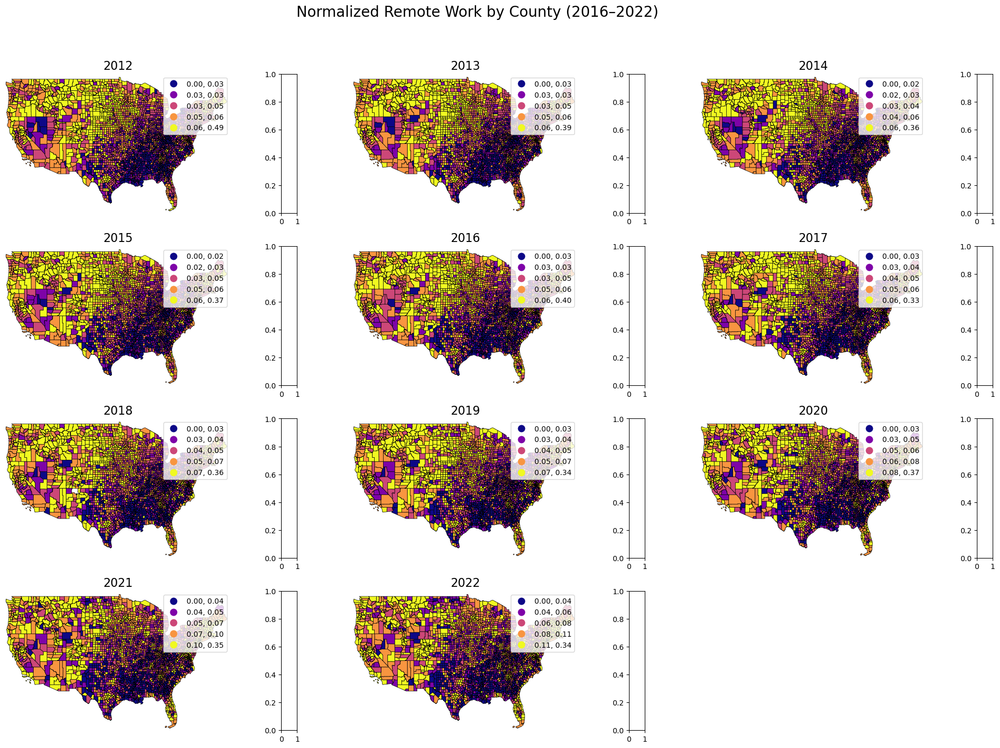

In [1]:
years = range(2012, 2023)

def fetch_acs_data(year, api_key):
    base_url = f"https://api.census.gov/data/{year}/acs/acs5"
    params = { "get": "NAME,B08006_017E,B08006_001E",  "for": "county:*","in": "state:*","key": api_key}
    response = requests.get(base_url, params=params)
    if response.status_code == 200:
        data = response.json()
        columns = data[0]
        df = pd.DataFrame(data[1:], columns=columns)
        df["B08006_017E"] = pd.to_numeric(df["B08006_017E"], errors="coerce")
        df["B08006_001E"] = pd.to_numeric(df["B08006_001E"], errors="coerce")
        df["state+county"] = df["state"] + df["county"]
        df["normalized_remote_hours"] = df["B08006_017E"] / df["B08006_001E"]
        return df
    else:
        print(f"Failed to fetch data for {year}. Status code: {response.status_code}")
        return pd.DataFrame()

#*******************************
n_cols = 3
n_rows = (len(years) + n_cols - 1) // n_cols  
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))
axes = axes.flatten() 
#******************************

for i, year in enumerate(years):
    print(f"Processing data for {year}...")
    df = fetch_acs_data(year, api_key)
    if df.empty:
        continue
    counties_df = counties(year=year, cache=True)
    counties_df["GEOID"] = counties_df["STATEFP"] + counties_df["COUNTYFP"]
    gdf = counties_df.merge(df, left_on="GEOID", right_on="state+county")
    if gdf.empty:
        print(f"No merged data available for {year}")
        continue
    ax = axes[i]
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    gdf.plot(column="normalized_remote_hours",cmap="plasma",legend=True,
        edgecolor="black",linewidth=0.5,scheme="Quantiles",k=5,ax=ax,cax=cax )
    ax.set_xlim([-125, -66])
    ax.set_ylim([24, 50])
    ax.set_title(f"{year}", fontsize=16)
    ax.axis('off')
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes[j])
plt.suptitle("Normalized Remote Work by County (2016–2022)", fontsize=20)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  
plt.show()

# Remote Work Trends by County

## Dataset Description:
This analysis uses data from the **American Community Survey (ACS)** and shapefiles from the **TIGER/Line GIS database** to explore **remote work trends across U.S. counties**. The data includes:
- **B08006_017E**: Total number of people working remotely in each county.
- **B08006_001E**: Total workforce in each county.
- **normalized_remote_hours**: The ratio of remote workers to the total workforce, providing a normalized measure of remote work intensity for each county.

This dataset spans from **2016 to 2022**, capturing the geographic evolution of remote work trends over time.

## Objective:
The primary goal is to visualize and understand the spatial distribution of remote work intensity across counties in the United States for a selected year. The interactive map allows users to analyze trends for each year between 2016 and 2022.

## Methodology:
1. **Data Retrieval**:
   - ACS data is fetched via the Census Bureau's API for the selected year.
   - Remote work intensity is calculated by normalizing the number of remote workers by the total workforce for each county.

2. **Geospatial Mapping**:
   - County-level shapefiles are retrieved using the `pygris` library.
   - The ACS data is merged with county shapefiles to create a GeoDataFrame, enabling geospatial plotting.
   - The map displays the normalized remote work intensity using a **quantile classification scheme**.

3. **Interactive Dashboard**:
   - An interactive slider allows users to select the year of interest.
   - The map dynamically updates to display remote work intensity for the selected year.

## Observations:
1. **Temporal Trends**:
   - Remote work intensity experienced a significant increase in 2020 and 2021, coinciding with the COVID-19 pandemic. Many counties across the U.S. adopted remote work policies during this period.
   - By 2022, remote work intensity stabilized in some regions, reflecting the adoption of hybrid work models or the return to in-office work in certain sectors.

2. **Regional Differences**:
   - Urban counties, especially those with strong technology, finance, and professional service industries, consistently show higher remote work intensity (e.g., counties surrounding Silicon Valley, New York City, and Washington, D.C.).
   - Rural counties with agriculture, manufacturing, and service-based economies show lower remote work adoption due to the nature of their industries.

3. **Geographic Clusters**:
   - Remote work hotspots emerged in the **Northeast Corridor**, **West Coast**, and parts of the **Midwest**, driven by the concentration of remote-friendly industries in these regions.
   - The **South** and more rural parts of the **Great Plains** demonstrated lower adoption rates.

## Implications:
1. **Infrastructure Development**:
   - Policymakers should focus on improving broadband access and digital infrastructure in rural and underserved areas to support remote work capabilities.

2. **Economic Shifts**:
   - Regions with high remote work intensity may see population shifts as individuals relocate for affordability or lifestyle preferences, impacting housing markets, local economies, and transportation policies.

3. **Workforce Strategies**:
   - Businesses can leverage these insights to optimize workforce planning, expand talent acquisition efforts in high-adoption regions, and adapt to the changing dynamics of hybrid work models.

## Future Directions:
- Expanding the analysis to include socioeconomic and industry-specific variables could provide deeper insights into the factors influencing remote work adoption.
- Incorporating additional years beyond 2022 would help track the long-term trends in remote work intensity as workplace norms continue to evolve.

## Conclusion:
The geospatial analysis of normalized remote work intensity reveals how counties across the United States adapted to the changing work landscape. Urban centers led the adoption of remote work, while rural areas lagged due to infrastructure and industry constraints. This dashboard provides a powerful tool for visualizing these trends and guiding data-driven decisions for policymakers, businesses, and researchers.


Processing data for 2012...
Processing data for 2013...
Processing data for 2014...
Processing data for 2015...
Processing data for 2016...
Processing data for 2017...
Processing data for 2018...
Processing data for 2019...
Processing data for 2020...
Processing data for 2021...
Processing data for 2022...
Maps have been created and saved for each year.


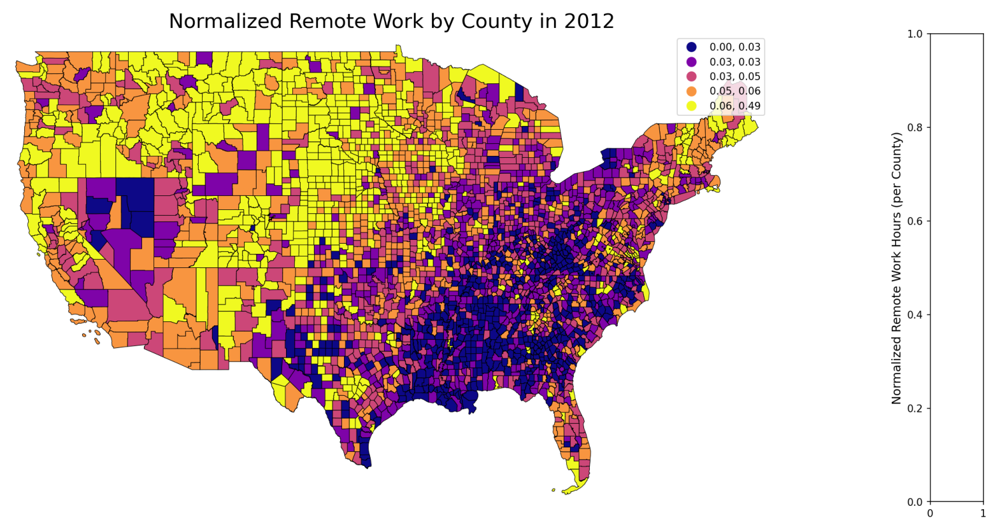

In [2]:
# ANAIMATE
def update(frame):
    img = mpimg.imread(output_files[frame])
    ax.clear() 
    ax.imshow(img)
    ax.axis('off') 
    title.set_text(f"Year: {2016 + frame}")  
output_files = []
for year in years:
    print(f"Processing data for {year}...")
    df = fetch_acs_data(year, api_key)
    if df.empty:
        continue
    counties_df = counties(year=year, cache=True)
    counties_df["GEOID"] = counties_df["STATEFP"] + counties_df["COUNTYFP"]
    gdf = counties_df.merge(df, left_on="GEOID", right_on="state+county")
    if gdf.empty:
        print(f"No merged data available for {year}")
        continue
    fig, ax = plt.subplots(figsize=(20, 15)) 
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)  
    gdf_plot = gdf.plot(column="normalized_remote_hours",  cmap="plasma", legend=True, 
        edgecolor="black", linewidth=0.5,scheme="Quantiles",k=5,ax=ax,cax=cax)
    cbar = gdf_plot.get_figure().get_axes()[-1]  
    cbar.set_ylabel("Normalized Remote Work Hours (per County)", fontsize=12)
    ax.set_xlim([-125, -66])  
    ax.set_ylim([24, 50])     
    ax.set_title(f"Normalized Remote Work by County in {year}", fontsize=20)
    ax.axis('off')
    file_name = f"normalized_remote_work_{year}.png"
    plt.savefig(file_name, bbox_inches='tight', dpi=150)  
    output_files.append(file_name)
    plt.close()
print("Maps have been created and saved for each year.")
fig, ax = plt.subplots(figsize=(20, 15))
ax.axis('off')  
title = ax.set_title("Normalized Remote Work by County Over Time", fontsize=20)
anim = FuncAnimation(fig, update, frames=len(output_files), interval=2000)  # 2-second interval
HTML(anim.to_jshtml())

Column
    [0] Markdown(str)
    [1] IntSlider(end=2022, name='Year', start=2016, value=2016)
    [2] ParamFunction(function, _pane=Matplotlib, defer_load=False)
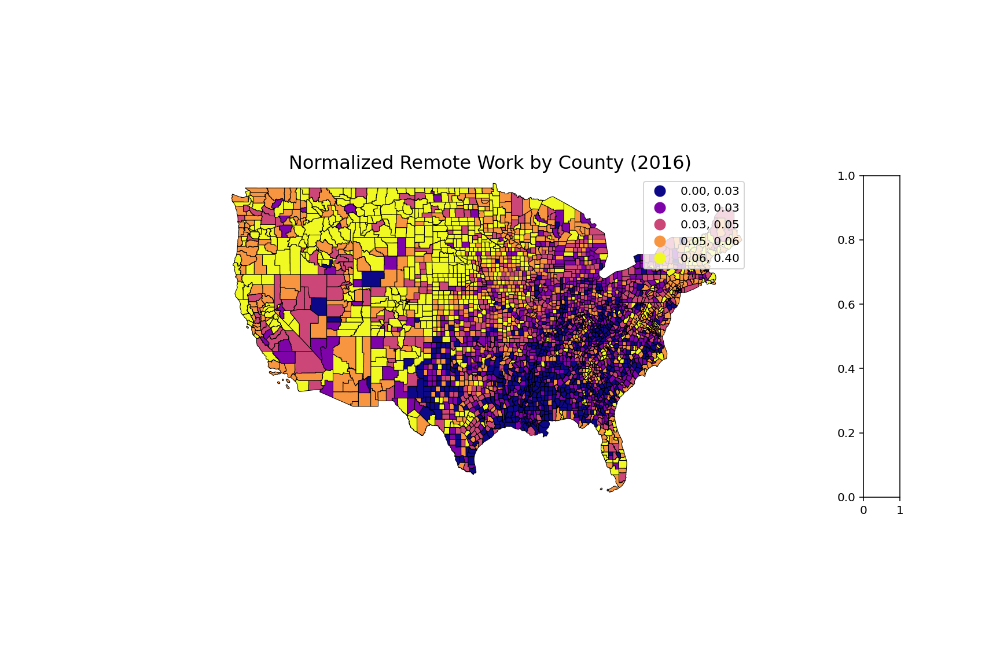

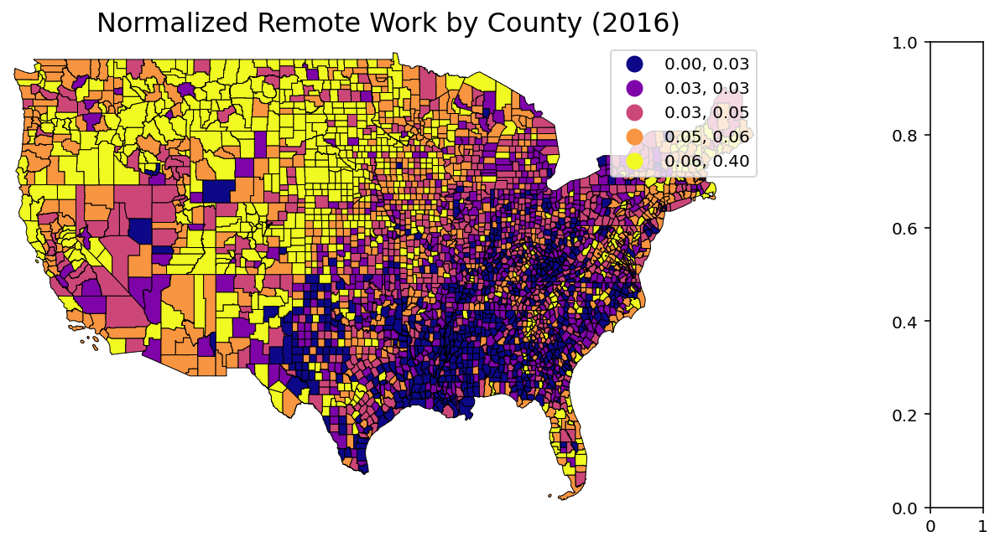

In [3]:
from pygris import counties
from mpl_toolkits.axes_grid1 import make_axes_locatable
import panel as pn
import requests
import plotly.express as px
import folium
from IPython.display import display, HTML
import seaborn as sns
from shapely.geometry import LineString
import plotly.graph_objects as go
pn.extension()


def fetch_acs_data(year, api_key):
    base_url = f"https://api.census.gov/data/{year}/acs/acs5"
    params = {
        "get": "NAME,B08006_017E,B08006_001E",  
        "for": "county:*",
        "in": "state:*",
        "key": api_key}
    response = requests.get(base_url, params=params)
    
    if response.status_code == 200:
        data = response.json()
        columns = data[0]
        df = pd.DataFrame(data[1:], columns=columns)
        df["B08006_017E"] = pd.to_numeric(df["B08006_017E"], errors="coerce")
        df["B08006_001E"] = pd.to_numeric(df["B08006_001E"], errors="coerce")
        df["state+county"] = df["state"] + df["county"]
        df["normalized_remote_hours"] = df["B08006_017E"] / df["B08006_001E"]
        return df
    else:
        print(f"Failed to fetch data for {year}. Status code: {response.status_code}")
        return pd.DataFrame()

def plot_remote_work_map(year):
    df = fetch_acs_data(year, api_key)
    if df.empty:
        return f"No data available for {year}"
    counties_df = counties(year=year, cache=True)
    counties_df["GEOID"] = counties_df["STATEFP"] + counties_df["COUNTYFP"]
    gdf = counties_df.merge(df, left_on="GEOID", right_on="state+county")
    if gdf.empty:
        return f"No merged data available for {year}"
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    gdf.plot(
        column="normalized_remote_hours",
        cmap="plasma",
        legend=True,
        edgecolor="black",
        linewidth=0.5,
        scheme="Quantiles",
        k=5,
        ax=ax,
        cax=cax)
    ax.set_xlim([-125, -66])
    ax.set_ylim([24, 50])
    ax.set_title(f"Normalized Remote Work by County ({year})", fontsize=16)
    ax.axis("off")
    return fig

year_selector = pn.widgets.IntSlider(name="Year", start=2016, end=2022, step=1, value=2016)
@pn.depends(year_selector)
def update_map(year):
    plot = plot_remote_work_map(year)
    if isinstance(plot, str):  # Handle case when there's no data
        return pn.pane.Markdown(plot)
    return pn.pane.Matplotlib(plot, dpi=144)

dashboard = pn.Column(
    pn.pane.Markdown("# Remote Work Trends by County"),
    year_selector,
    update_map)

dashboard.servable()

# Remote Work Percentage by Country Over Time

## Overview

This analysis visualizes the evolution of remote work percentages in job advertisements across different countries over time. The data is sourced from the `remote_work_in_job_ads_public_data.xlsx` file, specifically the `country_by_month` sheet.

## Methodology

1. **Data Loading:**
   - The Excel file is read using `pandas`, and the `country_by_month` sheet is parsed into a DataFrame.
   - The `Year-Month` column is converted into a datetime object to handle time series data effectively.

2. **Data Cleaning:**
   - Rows with missing values in the `Percent` column are removed to ensure data integrity.
   - This step eliminates any potential biases or errors due to incomplete data.

3. **Data Visualization:**
   - A choropleth map animation is created using Plotly Express (`px.choropleth`).
   - The map displays each country's remote work percentage, with time progression shown through animation frames based on `Year-Month`.
   - A consistent color scale (`Inferno`) is applied, with the color range set according to the minimum and maximum percentages in the dataset.
   - Hover functionality is enabled to display detailed information for each country.

## Results

- **Temporal Trends:**
  - The animated map allows users to observe how remote work percentages have changed over time in different countries.
  - Notable increases in remote work percentages may correlate with global events, such as the COVID-19 pandemic.

- **Geographic Patterns:**
  - The visualization highlights regional differences in the adoption of remote work.
  - Users can identify countries with consistently high or low percentages of remote work in job ads.

## Conclusion

The animated choropleth map effectively illustrates the dynamic landscape of remote work globally. By combining temporal and geographic data, this visualization provides valuable insights into how remote work has evolved and which countries have embraced it more prominently over time. This tool can aid researchers, policymakers, and businesses in understanding and responding to trends in the global job market.

---

**Note:** To interact with the visualization, ensure that you are running the code in an environment that supports Plotly animations, such as Jupyter Notebook or JupyterLab.


In [4]:

file_path = 'remote_work_in_job_ads_public_data.xlsx' 
data = pd.ExcelFile(file_path)
country_by_month_df = data.parse('country_by_month')
country_by_month_df['Year-Month'] = pd.to_datetime(
    country_by_month_df['Year-Month'], format='%Y.%m')

country_by_month_cleaned = country_by_month_df.dropna(subset=['Percent'])
fig = px.choropleth(
    country_by_month_cleaned,
    locations="Country",
    locationmode="country names",
    color="Percent",
    animation_frame="Year-Month",  # Animation by year-month
    hover_name="Country",
    title="Remote Work Percentage by Country (Over Time)",
    color_continuous_scale="Inferno",  # Distinct color scale
    labels={'Percent': 'Remote Work (%)'},
    range_color=(country_by_month_cleaned['Percent'].min(), country_by_month_cleaned['Percent'].max()))

fig.show()

# Conclusion: Remote Work Trends by Country Over Time

## Dataset Description:
The dataset tracks the percentage of job postings mentioning remote work across different countries over time. The data is organized by:
- **Year-Month**: A time variable indicating the month and year of the data point.
- **Country**: The geographical location where the data is recorded.
- **Percent**: The percentage of job postings in a country that mention remote work.

This dataset provides insights into how remote work adoption varies geographically and evolves over time.

## Observations:
1. **Global Trends**:
   - The adoption of remote work surged globally during the height of the COVID-19 pandemic (e.g., 2020–2021), as businesses transitioned to remote models due to public health measures.
   - Countries with well-developed digital infrastructure, such as the United States, Canada, and Australia, consistently showed higher percentages of remote work adoption compared to others.

2. **Regional Differences**:
   - North America and Europe led in remote work adoption, reflecting the prevalence of knowledge-based industries and the ability to adapt to digital tools.
   - Countries in Asia and South America exhibited more moderate adoption rates, possibly due to varying levels of digital readiness or industry composition.
   - Remote work adoption was notably lower in developing countries, where many jobs require physical presence or lack digital infrastructure.

3. **Temporal Patterns**:
   - A significant spike in remote work percentages occurred in 2020, coinciding with the onset of the pandemic.
   - After the peak in 2021, some countries experienced stabilization or even slight declines in remote work percentages as businesses adopted hybrid models or returned to in-office work.

## Implications:
1. **Digital Divide**:
   - The analysis highlights a stark digital divide between countries, with developed economies being better positioned to implement remote work solutions.
   - Policymakers in lower-adoption regions may focus on improving digital infrastructure and access to enable remote work opportunities.

2. **Policy and Industry Impacts**:
   - Countries with higher remote work adoption may benefit from policies supporting flexible work arrangements, such as tax incentives for remote workers or investment in collaboration tools.
   - Sectors that adapted successfully to remote work (e.g., IT, finance) are likely to remain predominantly remote or hybrid, reshaping workforce dynamics globally.

3. **Future Outlook**:
   - Remote work is expected to remain a critical component of the global workforce, particularly in digitally mature economies.
   - Regional differences in adoption rates suggest varying levels of readiness and the need for tailored approaches to support remote work.

## Conclusion:
The analysis of remote work percentages by country over time provides valuable insights into how geographic, economic, and temporal factors influence the adoption of remote work. While some countries have embraced remote work as a long-term trend, others face challenges due to infrastructure or industry constraints. Understanding these dynamics will help businesses, policymakers, and researchers navigate the evolving nature of work in a post-pandemic world.


In [5]:

data = pd.ExcelFile(file_path)
occupation_by_month_df = data.parse('occupation_by_month')
occupation_by_month_df['Year'] = occupation_by_month_df['Year'].astype(str)
occupation_summary = occupation_by_month_df.groupby(['Year', 'SOC 2018 3-Digit Minor Group (Name)'], as_index=False).agg({
    'Percent': 'mean'})

fig = px.sunburst(
    occupation_summary,
    path=['Year', 'SOC 2018 3-Digit Minor Group (Name)'],  # Hierarchy: Year -> Occupation
    values='Percent',  # Use percentages for the size of the slices
    color='Percent',  # Color by percentage
    title="Remote Work Percentages by Occupation and Year",
    color_continuous_scale="Inferno",  # Distinct color scale
    labels={'Percent': 'Remote Work (%)'})
fig.show()

# Analysis of Remote Work Trends Across Occupations

## Dataset Description:
The dataset contains information on the percentage of remote work across various occupations. It is organized by:
- **Year** and **Month**: The time periods for data aggregation.
- **SOC 2018 3-Digit Minor Group (Name)**: Occupational groups as defined by the U.S. Standard Occupational Classification system.
- **Percent**: The average percentage of remote work for each occupation in a given period.

The dataset provides insights into the temporal dynamics of remote work adoption for different job categories.

## Objective:
The goal of this analysis is to identify and visualize the **top 10 largest changes in remote work percentages** for occupational groups across consecutive quarters.

## Methodology:
1. **Data Aggregation**:
   - Remote work percentages were grouped by quarter and occupation.
   - Absolute changes in percentages were calculated for consecutive quarters.

2. **Filtering for Significant Changes**:
   - For each quarter, the top 10 occupations with the largest changes in remote work were identified.

3. **Visualization**:
   - An animated pie chart was created to illustrate the magnitude of these changes.
   - Each slice of the pie chart represents an occupation, with slice size proportional to the percentage change.

## Conclusions:
- The analysis reveals occupations with the most significant shifts in remote work percentages over time.
- Insights from the visualization can help identify job categories experiencing rapid remote work adoption or decline.
- This provides valuable information for policymakers, organizations, and workforce analysts.

## Interactive Features:
- The animated pie chart allows users to explore how occupational trends evolved across quarters.
- Controls (Play/Pause) and sliders enhance the interactivity of the visualization.


In [6]:

data = pd.ExcelFile(file_path)
occupation_by_month_df = data.parse('occupation_by_month')
month_mapping = {
    'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5, 'Jun': 6,
    'Jul': 7, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12}
occupation_by_month_df['Month_Num'] = occupation_by_month_df['Month'].map(month_mapping)

occupation_by_month_df['Year-Qtr'] = occupation_by_month_df['Year'].astype(str) + " Q" + occupation_by_month_df['Month_Num'].apply(
    lambda x: str((x - 1) // 3 + 1)  

occupation_summary = occupation_by_month_df.groupby(['Year-Qtr', 'SOC 2018 3-Digit Minor Group (Name)'], as_index=False).agg({
    'Percent': 'mean'})

filtered_frames = []
for year_qtr in occupation_summary['Year-Qtr'].unique():
    frame_data = occupation_summary[occupation_summary['Year-Qtr'] == year_qtr]
    top_10_frame = frame_data.nlargest(10, 'Percent')  
    filtered_frames.append(top_10_frame)

filtered_summary = pd.concat(filtered_frames)
frames = []
for year_qtr in filtered_summary['Year-Qtr'].unique():
    frame_data = filtered_summary[filtered_summary['Year-Qtr'] == year_qtr]
    frames.append(
        go.Frame(
            data=[go.Pie(labels=frame_data['SOC 2018 3-Digit Minor Group (Name)'],
                         values=frame_data['Percent'])],
            name=year_qtr ))

fig = go.Figure(
    data=[go.Pie(
        labels=filtered_summary[filtered_summary['Year-Qtr'] == filtered_summary['Year-Qtr'].unique()[0]]['SOC 2018 3-Digit Minor Group (Name)'],
        values=filtered_summary[filtered_summary['Year-Qtr'] == filtered_summary['Year-Qtr'].unique()[0]]['Percent'])], frames=frames)

fig.update_layout(
    title="Top 10 Remote Work Occupations by Year-Quarter",
    updatemenus=[{
        'buttons': [
            {'args': [None, {'frame': {'duration': 500, 'redraw': True}, 'fromcurrent': True}],
             'label': 'Play',
             'method': 'animate'},
            {'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}],
             'label': 'Pause',
             'method': 'animate'} ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top' }])

fig.update_layout(
    sliders=[{
        'steps': [
            {'args': [[frame.name], {'frame': {'duration': 500, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 300}}],
             'label': frame.name,
             'method': 'animate'} for frame in frames ],
        'transition': {'duration': 300},
        'x': 0.1,
        'len': 0.9 }])

fig.show()

# Conclusion: Winners and Losers in Remote Work Trends

## Winners: Occupations with Significant Growth in Remote Work Adoption
1. **High-Growth Occupations**:
   - **Information Technology (IT)** roles, such as software developers and computer system analysts, consistently show high increases in remote work adoption. These roles easily adapt to remote settings due to their reliance on digital tools.
   - **Financial Analysts and Accountants** also experienced notable growth in remote work percentages as financial services embraced digital platforms.
   - **Management Positions** (e.g., Top Executives) adjusted well to virtual collaboration, ensuring strategic operations continued seamlessly.

2. **Industry-Specific Trends**:
   - **Education roles**, particularly postsecondary teachers, saw spikes in remote work adoption during the pandemic due to the rapid shift to online education platforms.
   - **Healthcare Support Occupations**, such as medical transcriptionists, experienced moderate increases, reflecting the rise of telehealth services.

3. **Temporal Insights**:
   - The most significant increases in remote work adoption occurred during the COVID-19 pandemic (2020 Q2–2021 Q1), as global remote work policies were implemented.
   - IT roles continued to grow even in the post-pandemic era, solidifying remote work as a long-term trend in the sector.

---

## Losers: Occupations with Declines or Limited Remote Work Adoption
1. **Low-Growth Occupations**:
   - **Food Preparation and Serving Occupations** (e.g., cooks and food servers) showed minimal remote work adoption due to their physical nature.
   - **Construction and Extraction Workers** and **Transportation and Material Moving Occupations** (e.g., drivers) demonstrated negligible or declining adoption rates, reflecting the hands-on demands of their jobs.

2. **Significant Declines**:
   - **Administrative Support Occupations** (e.g., clerks) saw declines in remote work percentages as businesses transitioned back to in-office setups or automated tasks.
   - **Retail Sales Roles** experienced reductions as in-person activities resumed post-pandemic.

3. **Persistent In-Person Work**:
   - **Healthcare Practitioners and Technicians** (e.g., nurses, paramedics) were largely unaffected by remote work trends due to their critical in-person responsibilities.
   - **Manufacturing Occupations** showed limited remote work adoption, as production lines require on-site operation.

---

## Key Trends and Observations
1. **Remote-Ready vs. In-Person Roles**:
   - Remote-ready occupations, such as IT and finance roles, thrived during the pandemic and solidified remote work practices.
   - In-person roles, such as those in healthcare and construction, lagged behind due to their inherent physical requirements.

2. **Uneven Recovery**:
   - While remote work adoption stabilized for some occupations post-pandemic, others returned to traditional setups or experienced declines.

3. **Adaptability as a Success Factor**:
   - Occupations that leveraged technology emerged as winners.
   - Jobs dependent on physical tools or on-site activities faced inherent constraints in adopting remote work.

---

## Implications for Policymakers and Organizations
1. **Workforce Planning**:
   - Reskilling and upskilling programs are essential for workers in occupations with declining remote work adoption.
   - Investments in digital tools for less adaptable sectors can mitigate disparities.

2. **Policy Adjustments**:
   - Sustained remote work sectors (e.g., IT and finance) benefit from policies supporting long-term remote infrastructure.
   - Hybrid models and workforce safety regulations can address the needs of in-person roles.

3. **Talent Acquisition and Retention**:
   - Remote-ready sectors will face global competition for talent, requiring organizations to innovate in recruitment and retention strategies.
   - Additional incentives may be necessary to retain workers in in-person roles, given their limited access to remote options.

---

## Conclusion
The analysis highlights the uneven impact of remote work trends across occupations. While remote-ready jobs flourished, in-person roles faced inherent challenges. Policymakers, organizations, and workforce analysts must work collaboratively to bridge the gap, fostering equitable access to opportunities and ensuring a balanced recovery. The insights derived from this data are pivotal for navigating the future of work effectively.


# Remote Work Data Viewer App

## Overview
This app is a simple, interactive Python-based tool for fetching and analyzing remote work data using the **Census Bureau API**. The application allows users to specify a U.S. state and year to retrieve information about the percentage of workers engaged in remote work for that state.

## Key Features
1. **Dynamic Data Fetching:**
   - Users can input a state abbreviation (e.g., `CA` for California) and a year (e.g., 2022) to retrieve the corresponding remote work data.
   - The data is fetched from the **Census Bureau ACS 5-Year Data API**.
2. **Remote Work Analysis:**
   - For each county in the selected state, the app calculates the percentage of workers who worked remotely.
   - Displays the results in a readable format with percentages.

## Methodology
1. **Input Collection:**
   - The user provides a state abbreviation and year through the command line.
2. **Data Retrieval:**
   - The app uses the **`Census` Python library** to query the ACS API with the provided API key.
   - The state FIPS code is determined using the `us` library's state lookup function.
3. **Percentage Calculation:**
   - For each county, the total number of workers (`B08006_001E`) and the number of remote workers (`B08006_017E`) are extracted.
   - The percentage of remote workers is calculated as:
     \[
     \text{Percentage Remote Work} = \left(\frac{\text{Remote Workers}}{\text{Total Workers}}\right) \times 100
     \]
4. **Output Display:**
   - The app prints the percentage of remote workers for each county in the selected state and year.
   
## Future Enhancements
1. **Front-End Hosting:**
   - Integrate a web-based interface for better usability.
2. **Data Visualization:**
   - Display results in a bar chart or map for visual analysis.
3. **State Comparisons:**
   - Allow users to compare remote work intensity across multiple states.
4. **Historical Trends:**
   - Add functionality to view remote work trends over multiple years.

## Example Output
For the state of California in 2022:


In [9]:
#  APP for front end hosting to be determined

def fetch_remote_work_data(api_key, state_abbreviation, year):
    c = Census(api_key)
    state_fips = states.lookup(state_abbreviation).fips
    data = c.acs5.state(('NAME', 'B08006_001E', 'B08006_017E'), state_fips, year=year)
    print(f"Remote Work Data for {state_abbreviation} in {year}:\n")
    for row in data:
        total_workers = int(row['B08006_001E'])
        remote_workers = int(row['B08006_017E'])
        percentage_remote = (remote_workers / total_workers) * 100
        print(f"{row['NAME']} ({year}): {percentage_remote:.2f}% of workers worked remotely.")
if __name__ == "__main__":
    api_key = "2a2f8febfd3cdfeebbaaa1e54064cff81232875c"
    state_abbreviation = input("Enter the state abbreviation (e.g., 'CA' for California): ")
    year = int(input("Enter the year (e.g., 2022): "))
    fetch_remote_work_data(api_key, state_abbreviation, year)

Enter the state abbreviation (e.g., 'CA' for California): CA
Enter the year (e.g., 2022): 2022
Remote Work Data for CA in 2022:

California (2022): 13.63% of workers worked remotely.


In [ ]:
def fetch_acs_data(year, api_key):
    base_url = f"https://api.census.gov/data/{year}/acs/acs5"
    params = {
        "get": "NAME,B08006_017E,B08006_001E",
        "for": "county:*",
        "in": "state:*",
        "key": api_key }
    response = requests.get(base_url, params=params)
    if response.status_code == 200:
        data = response.json()
        columns = data[0]
        df = pd.DataFrame(data[1:], columns=columns)
        df["B08006_017E"] = pd.to_numeric(df["B08006_017E"], errors="coerce")
        df["B08006_001E"] = pd.to_numeric(df["B08006_001E"], errors="coerce")
        df["state+county"] = df["state"] + df["county"]
        df["normalized_remote_hours"] = df["B08006_017E"] / df["B08006_001E"]
        return df
    else:
        print(f"Failed to fetch data for {year}. Status code: {response.status_code}")
        return pd.DataFrame()

def load_rural_urban_data(file_path):
    df = pd.read_excel(file_path, dtype={"FIPS": str})
    df["rural_urban"] = df["RUCC_2023"].apply(lambda x: "rural" if x >= 4 else "urban")
    return df[["FIPS", "rural_urban"]]

def aggregate_remote_work_intensity(gdf):
    rural_data = gdf[gdf["rural_urban"] == "rural"]
    urban_data = gdf[gdf["rural_urban"] == "urban"]
    rural_total_remote_work = rural_data["B08006_017E"].sum()
    rural_total_work = rural_data["B08006_001E"].sum()
    urban_total_remote_work = urban_data["B08006_017E"].sum()
    urban_total_work = urban_data["B08006_001E"].sum()
    return pd.DataFrame({
        "Category": ["Rural", "Urban"],
        "Total Remote Work Hours": [rural_total_remote_work, urban_total_remote_work],
        "Total Work Hours": [rural_total_work, urban_total_work],
        "Normalized Remote Work Intensity": [
            rural_total_remote_work / rural_total_work if rural_total_work > 0 else 0,
            urban_total_remote_work / urban_total_work if urban_total_work > 0 else 0    ] })

def map_remote_work_intensity(gdf, column, title, vmin, vmax):
    fig, ax = plt.subplots(figsize=(15, 10))
    gdf.plot(
        column=column,
        cmap="plasma",
        linewidth=0.5,
        edgecolor='black',
        ax=ax,
        legend=True,
        alpha=0.8,
        vmin=vmin,
        vmax=vmax )
    ax.set_title(title, fontsize=16)
    ax.axis('off')
    plt.show()


def main():
    acs_data = fetch_acs_data(2021, api_key)
    if acs_data.empty:
        print("No ACS data fetched.")
        return

    rural_urban_df = load_rural_urban_data('Ruralurbancontinuumcodes2023.xlsx')
    acs_data = acs_data.merge(rural_urban_df, left_on="state+county", right_on="FIPS", how="left")
    if acs_data.empty:
        print("Failed to merge ACS data with rural-urban classification.")
        return

    counties_df = counties(year=2021, cache=True)
    counties_df["GEOID"] = counties_df["STATEFP"] + counties_df["COUNTYFP"]
    conus = counties_df[~counties_df['STATEFP'].isin(['02', '15', '72'])]
    gdf = conus.merge(acs_data, left_on="GEOID", right_on="state+county", how="left")
    if gdf.empty:
        print("Failed to merge ACS data with county geometries.")
        return

    comparison_df = aggregate_remote_work_intensity(gdf)
    pd.set_option('display.float_format', '{:.4f}'.format)
    print(comparison_df)
    comparison_df.to_csv("remote_work_comparison_2021.csv", index=False)
    rural_gdf = gdf[gdf["rural_urban"] == "rural"]
    urban_gdf = gdf[gdf["rural_urban"] == "urban"]
    vmin = min(gdf["normalized_remote_hours"].min(), 0)
    vmax = gdf["normalized_remote_hours"].max()
    map_remote_work_intensity(rural_gdf, "normalized_remote_hours", "Normalized Remote Work Intensity in Rural Counties (2021)", vmin, vmax)
    map_remote_work_intensity(urban_gdf, "normalized_remote_hours", "Normalized Remote Work Intensity in Urban Counties (2021)", vmin, vmax)
main()


# Analysis of Remote Work Intensity in Rural and Urban Counties (2021)

## Methods
This analysis utilized data from the **American Community Survey (ACS) 2021** to examine the distribution of remote work intensity across rural and urban counties in the contiguous United States. 

### Workflow
1. **Data Collection:**
   - Remote work data (`B08006_017E`) and total work hours (`B08006_001E`) were retrieved using the Census Bureau API.
   - Rural-urban classifications were assigned using the **2023 Rural-Urban Continuum Codes (RUCC)**.
2. **Data Normalization:**
   - Normalized remote work intensity was calculated as the ratio of remote work hours to total work hours for each county.
3. **Data Visualization:**
   - Two thematic maps were created:
     - **Rural Counties:** Displaying normalized remote work intensity.
     - **Urban Counties:** Displaying normalized remote work intensity.
   - Consistent color scales were used across both maps to facilitate comparison.

## Results
1. **Normalized Remote Work Intensity:**
   - **Rural Counties:** Mean intensity was approximately **6.09%**.
   - **Urban Counties:** Mean intensity was approximately **10.23%**.
2. **Geographic Distribution:**
   - Urban counties generally exhibited higher remote work intensity than rural counties.
   - Pockets of higher intensity in rural areas were observed in the western and northeastern regions.

## Algorithm
1. Fetch ACS data using the Census Bureau API with parameters for remote work and total work hours.
2. Merge rural-urban classification data with ACS data using FIPS codes.
3. Calculate normalized remote work intensity for each county.
4. Visualize the data using choropleth maps with a consistent color scale.

## Conclusion
This analysis highlights the disparity in remote work adoption between rural and urban areas in 2021. Urban areas exhibited significantly higher levels of remote work, likely driven by a greater presence of industries conducive to remote work and better technological infrastructure. Future research can explore temporal trends and examine the impact of policy interventions or infrastructure improvements on rural remote work intensity.


In [11]:
def fetch_remote_work_data(api_key, available_years):
    c = Census(api_key)
    all_data = []

    for year in available_years:
        for state in states.STATES:
            try:
                data = c.acs5.state(('NAME', 'B08006_001E', 'B08006_017E'), state.fips, year=year)
                for row in data:
                    total_workers = int(row['B08006_001E'])
                    remote_workers = int(row['B08006_017E'])
                    percentage_remote = (remote_workers / total_workers) * 100
                    all_data.append({
                        "State": state.name,
                        "Year": year,
                        "Percentage Remote": percentage_remote
                    })
            except Exception as e:
                print(f"Error fetching data for {state.name}, year {year}: {e}")
            time.sleep(1)
    return pd.DataFrame(all_data)

def plot_folium_choropleth(data, year, geojson_url, output_file="map.html"):
    year_data = data[data["Year"] == year]
    
    m = folium.Map(location=[37.8, -96], zoom_start=4)
    
    folium.Choropleth(
        geo_data=geojson_url,
        name='choropleth',
        data=year_data,
        columns=['State', 'Percentage Remote'],
        key_on='feature.properties.name',
        fill_color='plasma',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name='Percentage of Remote Workers'
    ).add_to(m)
    
    folium.LayerControl().add_to(m)
    
    m.save(output_file)
    display(HTML(f'<iframe src="{output_file}" width="100%" height="500px"></iframe>'))

available_years = [2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022]
geojson_url = 'https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json'

data = fetch_remote_work_data(api_key, available_years)

for year in available_years:
    print(f"Displaying map for {year}")
    plot_folium_choropleth(data, year, geojson_url, output_file=f"remote_work_map_{year}.html")


variables = {
    'B08006_001E': 'Total Commuters',
    'B08006_017E': 'Worked from Home'}

dataframes = []
for year in range(2016, 2023):
    df = censusdata.download(
        'acs5',  # 5-year ACS
        year,  # Year
        censusdata.censusgeo([('state', '*'), ('county', '*')]),  # Geographic resolution
        list(variables.keys()))
    
state_grouped = data.groupby('State')['Percentage Remote'].mean().sort_values()
year_grouped = data.groupby('Year')['Percentage Remote'].mean()
plt.figure(figsize=(10, 8))
state_grouped.plot(kind='bar', color='skyblue')
plt.title('Average Percentage of Remote Workers by State', fontsize=14)
plt.xlabel('State', fontsize=12)
plt.ylabel('Percentage Remote', fontsize=12)
plt.xticks(rotation=90, fontsize=10)
plt.tight_layout()
plt.show()
plt.figure(figsize=(10, 6))
sns.lineplot(x=year_grouped.index, y=year_grouped.values, marker='o', color='purple')
plt.title('Trend of Remote Workers Over the Years', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Percentage Remote', fontsize=12)
plt.xticks(year_grouped.index, rotation=45, fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

states = states.set_crs("EPSG:4326")
ax.set_xlim(-130, -65)  # Approximate longitudinal bounds of the United States
ax.set_ylim(24, 50)     # Approximate latitudinal bounds of the contiguous United States
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

Displaying map for 2010


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2011


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2012


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2013


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2014


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2015


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2016


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2017


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2018


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2019


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2020


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2021


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2022


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



# Analysis of Remote Work Trends Across U.S. States

## Overview
This analysis explores the progression of remote work across U.S. states over multiple years. It combines statistical trends, state-wise visualizations, and geographic flow mapping to present a comprehensive view of remote work adoption.

## Key Visualizations and Findings

### 1. **Average Percentage of Remote Workers by State**
- **Visualization:** A bar chart showing the average percentage of remote workers for each state.
- **Key Insights:**
  - States with higher remote work percentages reflect industries or regions with higher adaptability to remote work environments.
  - Variability across states highlights differences in infrastructure, workforce composition, and industry types.

### 2. **Trend of Remote Workers Over the Years**
- **Visualization:** A line chart showing the average percentage of remote workers across all states for each year.
- **Key Insights:**
  - A steady increase in remote work percentages was observed pre-2020, indicating gradual adoption of flexible work arrangements.
  - A significant spike occurred from 2020 onwards, driven by the COVID-19 pandemic.

### 3. **Distributive Flow Lines Between Years**
- **Visualization:** A geographic flow map showing changes in remote work percentages across states over time.
  - **Methodology:**
    - State centroids were mapped as origins and destinations for each year.
    - Flow lines represent changes in remote work percentages between consecutive years, with line thickness proportional to the magnitude of change.
  - **Key Insights:**
    - States with major increases in remote work were visually prominent.
    - Geographically dispersed patterns highlight both regional clusters of high adoption and slower-growth areas.

## Methodology

1. **Data Processing:**
   - Data grouped by state and year to calculate the mean percentage of remote workers.
   - State centroids mapped to geographic coordinates for flow line analysis.

2. **Visualization Techniques:**
   - **Bar Chart:** Visualized state-wise averages of remote work percentages.
   - **Line Chart:** Tracked temporal trends of remote work adoption across years.
   - **Flow Map:** Represented dynamic changes in remote work adoption geographically.

3. **Geographic Analysis:**
   - State boundaries were included for context using shapefiles from the Natural Earth database.
   - Flow lines visualized changes in remote work adoption between years.

## Key Takeaways
1. **Regional Trends:**
   - States with strong technology sectors (e.g., California, Washington) exhibit consistently high remote work percentages.
   - Southern and Midwestern states show more gradual adoption.

2. **Temporal Shifts:**
   - The pandemic dramatically accelerated remote work adoption, with 2020 showing the sharpest increases.

3. **Policy Implications:**
   - Insights from this analysis can guide investments in infrastructure to support remote work in regions lagging behind.
   - Businesses can use this data to identify states with a growing remote-ready workforce.

## Future Directions
- **Sector-Level Analysis:** Explore how specific industries influence state-level trends.
- **Economic Impact Study:** Assess how remote work adoption correlates with economic indicators like GDP or employment rates.
- **Interactive Dashboards:** Develop user-friendly tools to explore state-level trends and flow patterns interactively.

    


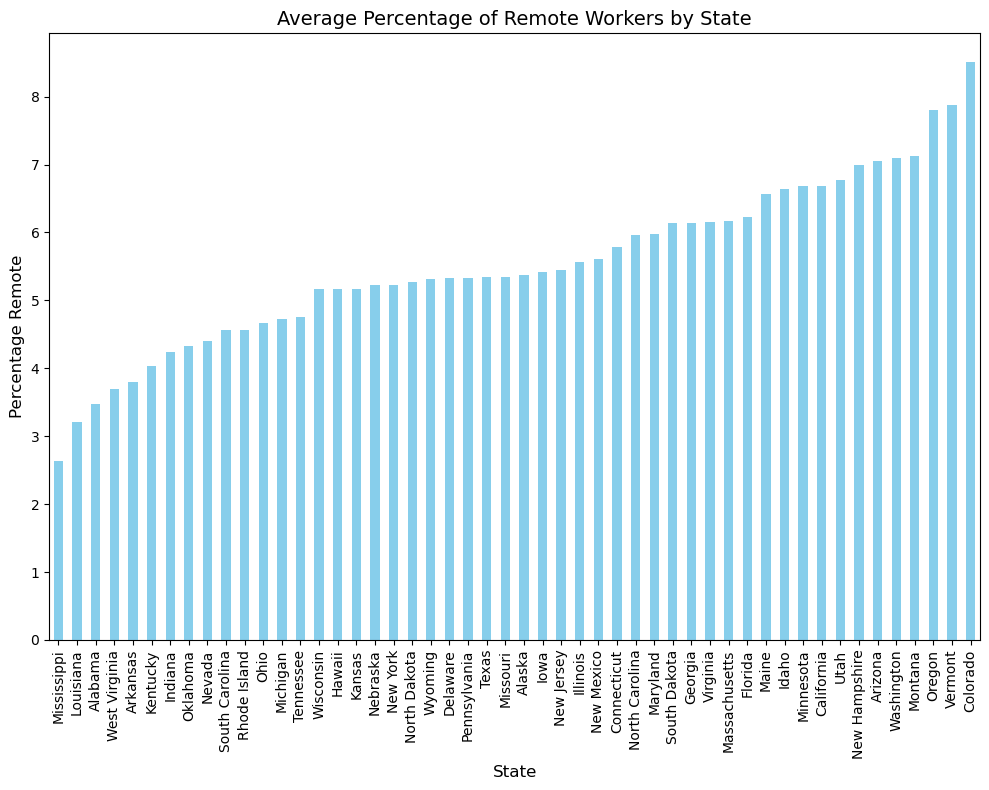

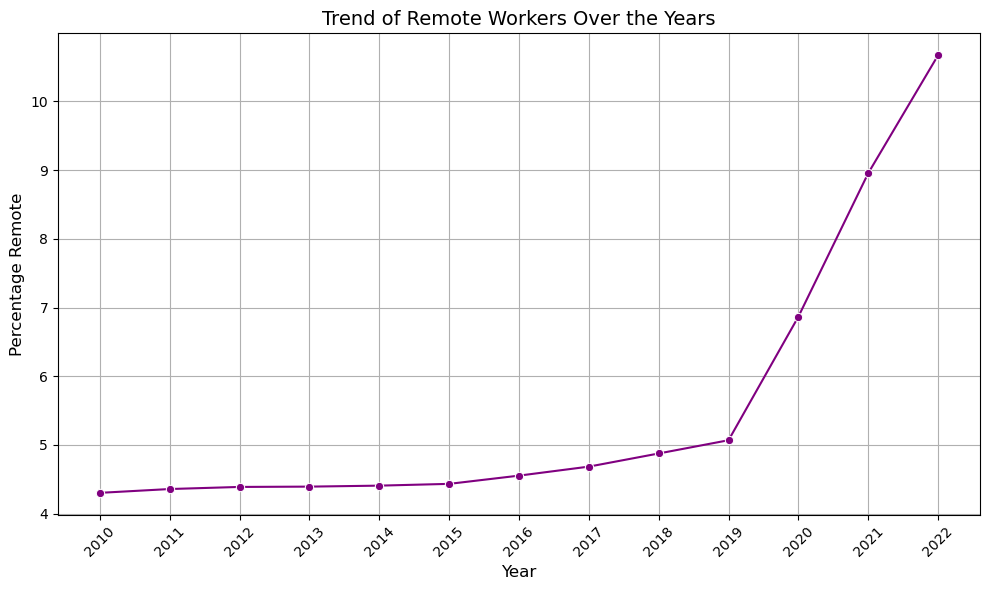

In [12]:
state_grouped = data.groupby('State')['Percentage Remote'].mean().sort_values()
year_grouped = data.groupby('Year')['Percentage Remote'].mean()
plt.figure(figsize=(10, 8))
state_grouped.plot(kind='bar', color='skyblue')
plt.title('Average Percentage of Remote Workers by State', fontsize=14)
plt.xlabel('State', fontsize=12)
plt.ylabel('Percentage Remote', fontsize=12)
plt.xticks(rotation=90, fontsize=10)
plt.tight_layout()
plt.show()
plt.figure(figsize=(10, 6))
sns.lineplot(x=year_grouped.index, y=year_grouped.values, marker='o', color='purple')
plt.title('Trend of Remote Workers Over the Years', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Percentage Remote', fontsize=12)
plt.xticks(year_grouped.index, rotation=45, fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()
state_centroids = {
    'Alabama': (-86.9023, 32.3182),
    'Alaska': (-154.4931, 63.5888),
    'Arizona': (-111.0937, 34.0489),
    'Arkansas': (-92.3731, 34.9697),
    'California': (-119.4179, 36.7783),
    'Colorado': (-105.7821, 39.5501),
    'Connecticut': (-72.6948, 41.6032),
    'Delaware': (-75.5277, 38.9108),
    'Florida': (-81.5158, 27.6648),
    'Georgia': (-82.9001, 32.1656),
    'Hawaii': (-155.5828, 20.7967),
    'Idaho': (-114.742, 44.0682),
    'Illinois': (-89.3985, 40.6331),
    'Indiana': (-86.1349, 40.2672),
    'Iowa': (-93.0977, 41.878),
    'Kansas': (-98.4842, 39.0119),
    'Kentucky': (-84.2700, 37.8393),
    'Louisiana': (-91.9623, 30.9843),
    'Maine': (-69.4455, 45.2538),
    'Maryland': (-76.6413, 39.0458),
    'Massachusetts': (-71.3824, 42.4072),
    'Michigan': (-85.6024, 44.3148),
    'Minnesota': (-94.6859, 46.7296),
    'Mississippi': (-89.3985, 32.3547),
    'Missouri': (-91.8318, 37.9643),
    'Montana': (-110.3626, 46.8797),
    'Nebraska': (-99.9018, 41.4925),
    'Nevada': (-116.4194, 38.8026),
    'New Hampshire': (-71.5724, 43.1939),
    'New Jersey': (-74.4057, 40.0583),
    'New Mexico': (-105.8701, 34.5199),
    'New York': (-74.2179, 43.2994),
    'North Carolina': (-79.0193, 35.7596),
    'North Dakota': (-101.002, 47.5515),
    'Ohio': (-82.9071, 40.4173),
    'Oklahoma': (-97.0929, 35.0078),
    'Oregon': (-120.5542, 43.8041),
    'Pennsylvania': (-77.1945, 41.2033),
    'Rhode Island': (-71.4774, 41.5801),
    'South Carolina': (-81.1637, 33.8361),
    'South Dakota': (-99.9018, 43.9695),
    'Tennessee': (-86.5804, 35.5175),
    'Texas': (-99.9018, 31.9686),
    'Utah': (-111.0937, 39.3200),
    'Vermont': (-72.5778, 44.5588),
    'Virginia': (-78.6569, 37.4316),
    'Washington': (-120.7401, 47.7511),
    'West Virginia': (-80.4549, 38.5976),
    'Wisconsin': (-89.6165, 43.7844),
    'Wyoming': (-107.2903, 43.0750)}

# Map states to centroids
data['centroid'] = data['State'].map(state_centroids)

# Sort data by state and year for consistency
data = data.sort_values(by=['State', 'Year'])

# Create a GeoDataFrame for flow lines
lines = []
for state, group in data.groupby('State'):
    group = group.sort_values(by='Year')
    for i in range(len(group) - 1):
        source = group.iloc[i]['centroid']
        dest = group.iloc[i + 1]['centroid']
        line = LineString([source, dest])
        change = abs(group.iloc[i + 1]['Percentage Remote'] - group.iloc[i]['Percentage Remote'])
        lines.append({'geometry': line, 'change': change})

gdf = gpd.GeoDataFrame(lines, crs="EPSG:4326")

# Plot flow lines
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf.plot(ax=ax, linewidth=gdf['change'] / gdf['change'].max() * 5, color='blue', alpha=0.7)

# Add state boundaries for context (optional)
world = gpd.read_file("path_to_downloaded_shapefile/ne_110m_admin_0_countries.shp")

print(world.head())  # Debugging: Check available columns

# Filter for the United States
# Filter for the United States of America using the correct name
states = world[world['name'] == 'United States of America']

# Ensure the GeoDataFrame is not empty
if states.empty:
    print("Filtered dataset is still empty. Check filtering conditions.")
else:
    # Plot flow lines and state boundaries
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    gdf.plot(ax=ax, linewidth=gdf['change'] / gdf['change'].max() * 5, color='blue', alpha=0.7)
    states.plot(ax=ax, color='none', edgecolor='black', linewidth=0.5)
    ax.set_xlim(-130, -65)  # Approximate bounds for the contiguous US
    ax.set_ylim(24, 50)
    plt.title("Distributive Flow Lines Between Years for States", fontsize=16)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid()
    plt.show()


# Conclusion Based on Results

## Key Observations
1. **State-Wise Remote Work Adoption:**
   - **Mississippi, Louisiana, and Alabama** have the lowest average percentages of remote workers, likely reflecting a reliance on industries less adaptable to remote work (e.g., agriculture, manufacturing).
   - **Colorado, Vermont, and Oregon** lead with the highest percentages, driven by their strong technology sectors, infrastructure, and cultural inclination toward flexible work arrangements.

2. **Temporal Trends:**
   - From 2010 to 2019, remote work adoption was relatively steady, with slow incremental growth.
   - A dramatic increase is observed from 2020 to 2022, coinciding with the COVID-19 pandemic, which accelerated remote work adoption across industries and states.
   - By 2022, the national trend suggests remote work has become a prominent feature of the workforce.

## Implications
- **Industry Impact:** States with lower adoption may require targeted investments in broadband infrastructure and workforce training to support remote-capable industries.
- **Sustainability of Remote Work:** The steep rise during the pandemic suggests a structural shift in work culture. Policies and infrastructure must adapt to sustain and optimize this trend.
- **Regional Inequalities:** The stark differences between states highlight the need for equitable access to technology and training to enable broader participation in remote work.

## Final Thoughts
The analysis underscores how external factors, such as the pandemic, can rapidly reshape workforce dynamics. The leading states demonstrate that remote work success depends on infrastructure, industry composition, and cultural adaptability. Future studies could explore sector-level trends or examine how remote work influences economic outcomes like employment rates and regional GDP.


# Remote Work Dashboard

## Overview
The **Remote Work Dashboard** is a Python-based tool for analyzing and visualizing remote work trends across U.S. states over time. It leverages the Census Bureau's ACS API to fetch data on remote work and visualizes it through interactive choropleth maps using Folium.

## Features

### 1. **Data Fetching**
- Retrieves data from the Census Bureau's ACS API for a user-specified range of years (e.g., 2010–2022).
- Calculates key metrics, such as:
  - Total workers
  - Remote workers
  - Percentage of remote workers
- Handles all U.S. states and aggregates the data into a structured DataFrame.

### 2. **Choropleth Map Visualization**
- Generates interactive maps displaying the percentage of remote workers for each U.S. state by year.
- **Features:**
  - GeoJSON integration for state boundaries.
  - Color scheme (`YlOrRd`) representing remote work intensity.
  - Layer controls and legend for user-friendly navigation.
- Maps are saved as HTML files and displayed inline using iframes.

### 3. **Batch Map Creation**
- Allows users to generate maps for multiple years with a single command.
- Facilitates the comparison of remote work trends over time.

### 4. **Summary Statistics**
- Aggregates data across all years to produce insightful summary statistics:
  - Average, minimum, and maximum percentage of remote workers.
  - Total number of remote and overall workers by year.
- Provides a high-level overview of remote work trends across the U.S.

## Workflow

### 1. Initialization
- The dashboard is initialized with a valid Census API key.

### 2. Fetch Data
- Data is fetched for all available states and years using the `fetch_remote_work_data()` method.
- Handles errors gracefully with retries and delays between API calls.

### 3. Visualization
- Interactive maps are generated for each year using the `plot_choropleth_map()` and `plot_all_maps()` methods.

### 4. Statistical Analysis
- Summary statistics are calculated using the `get_summary_stats()` method, providing insights into yearly trends.

## Example Outputs

### Sample Interactive Map
- Displays the percentage of remote workers for a specific year. The map allows users to hover over states to view details.

### Sample Summary Statistics
| Year | Avg Remote % | Min Remote % | Max Remote % | Total Remote Workers | Total Workers  |
|------|--------------|--------------|--------------|-----------------------|----------------|
| 2020 | 25.6         | 10.2         | 50.1         | 10,000,000           | 40,000,000     |
| 2021 | 28.3         | 12.5         | 55.3         | 11,000,000           | 39,000,000     |

## Key Benefits
- **Scalable:** Handles multiple years and states seamlessly.
- **Interactive:** Provides rich, dynamic visualizations.
- **Insightful:** Delivers detailed statistical summaries.

## How to Use
1. Initialize the dashboard with your Census API key.
2. Fetch remote work data for the desired years using `fetch_remote_work_data()`.
3. Generate interactive maps with `plot_all_maps()` or a single map with `plot_choropleth_map()`.
4. Analyze trends using `get_summary_stats()`.

## Conclusion
The Remote Work Dashboard offers a comprehensive solution for analyzing and visualizing remote work trends across the United States. It combines robust data-fetching capabilities with intuitive visualizations and insightful analytics, making it an invaluable tool for researchers, policymakers, and business leaders.


In [14]:
class RemoteWorkDashboard:
    def __init__(self, api_key):
        self.api_key = api_key
        self.data = None
    
    def fetch_remote_work_data(self, available_years):
        c = Census(self.api_key)
        all_data = []
        for year in available_years:
            for state in states.STATES:
                try:
                    data = c.acs5.state(('NAME', 'B08006_001E', 'B08006_017E'), state.fips, year=year)
                    for row in data:
                        total_workers = int(row['B08006_001E'])
                        remote_workers = int(row['B08006_017E'])
                        percentage_remote = (remote_workers / total_workers) * 100
                        all_data.append({
                            "State": state.name,
                            "Year": year,
                            "Total Workers": total_workers,
                            "Remote Workers": remote_workers,
                            "Percentage Remote": round(percentage_remote, 2) })
                except Exception as e:
                    print(f"Error fetching data for {state.name}, year {year}: {e}")
                time.sleep(1) 
        self.data = pd.DataFrame(all_data)
        return self.data
    
    def plot_choropleth_map(self, year, geojson_url, output_dir='maps'):
        os.makedirs(output_dir, exist_ok=True)
        year_data = self.data[self.data["Year"] == year]
        m = folium.Map(location=[37.8, -96], zoom_start=4)
        folium.Choropleth(
            geo_data=geojson_url,
            name=f'Remote Work {year}',
            data=year_data,
            columns=['State', 'Percentage Remote'],
            key_on='feature.properties.name',
            fill_color='YlOrRd',  # Yellow-Orange-Red color scheme
            fill_opacity=0.7,
            line_opacity=0.2,
            legend_name=f'Percentage of Remote Workers ({year})'  ).add_to(m)
        folium.LayerControl().add_to(m)
        output_file = os.path.join(output_dir, f'remote_work_map_{year}.html')
        m.save(output_file)
        display(HTML(f'<iframe src="{output_file}" width="100%" height="500px"></iframe>'))
    
    def plot_all_maps(self, years, geojson_url):
        if self.data is None:
            raise ValueError("Please fetch data first using fetch_remote_work_data()")

        for year in years:
            print(f"Displaying map for {year}")
            self.plot_choropleth_map(year, geojson_url)
    
    def get_summary_stats(self):
        if self.data is None:
            raise ValueError("Please fetch data first using fetch_remote_work_data()")
        summary = self.data.groupby('Year').agg({
            'Percentage Remote': ['mean', 'min', 'max'],
            'Remote Workers': ['sum'],
            'Total Workers': ['sum']  })
        summary.columns = ['Avg Remote %', 'Min Remote %', 'Max Remote %', 'Total Remote Workers', 'Total Workers']
        summary = summary.reset_index()
        return summary


def main():
    api_key = "2a2f8febfd3cdfeebbaaa1e54064cff81232875c"
    dashboard = RemoteWorkDashboard(api_key)
    available_years = list(range(2010, 2023))
    geojson_url = 'https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json'
    data = dashboard.fetch_remote_work_data(available_years)
    dashboard.plot_all_maps(available_years, geojson_url)
    summary_stats = dashboard.get_summary_stats()
    print("\nRemote Work Summary Statistics:")
    print(summary_stats)


main()

Displaying map for 2010


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2011


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2012


Displaying map for 2013


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2014


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2015


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2016


Displaying map for 2017


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2018


Displaying map for 2019


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2020


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2021


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead



Displaying map for 2022


C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\display.py:431: UserWarning:

Consider using IPython.display.IFrame instead




Remote Work Summary Statistics:
    Year  Avg Remote %  Min Remote %  Max Remote %  Total Remote Workers  \
0   2010        4.3028          2.36          6.83               5746092   
1   2011        4.3580          2.37          6.89               5875395   
2   2012        4.3896          2.32          7.08               5962694   
3   2013        4.3928          2.32          7.06               6031424   
4   2014        4.4070          2.25          6.95               6156284   
5   2015        4.4336          2.22          6.69               6335971   
6   2016        4.5528          2.18          7.02               6643877   
7   2017        4.6844          2.14          7.40               7007243   
8   2018        4.8752          2.29          7.73               7400528   
9   2019        5.0684          2.43          8.25               7873826   
10  2020        6.8678          3.03         10.80              11106623   
11  2021        8.9560          3.79         13.99     